## Exploratory Data Analysis
Using combined news/tweet data from BuzzFeed, PolitiFact, GossipCop, COVID-19, Disasters. Unlike the FNID data, not all data has sources or titles. Also there are no dates included in this dataset.

The goal of this notebook is to conduct some Exploratory Data Analysis (EDA) on the dataset.

### Part 2

In [1]:
# load packages
import pandas as pd
import numpy as np
from scipy import stats
import pickle
import re
%matplotlib notebook
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
import plotly.express as px 
import plotly.graph_objects as go
sns.set()

# get stop words
import gensim
from nltk.corpus import stopwords
from gensim.parsing.preprocessing import STOPWORDS

from wordcloud import WordCloud

# more text preprocessing packges
from nltk.stem import WordNetLemmatizer 
from nltk.tokenize import word_tokenize
from nltk.util import ngrams
from collections import Counter
from sklearn.feature_extraction.text import CountVectorizer

#### Load Data

In [13]:
# load dataset
# tweet_data = pd.read_csv('combined_tweets.csv', na_filter= False)
# reload data with emotions from part 1
tweet_data = pd.read_csv('tweet_data_with_sentiment1.csv', na_filter= False)

print(tweet_data.shape)
tweet_data.head()

(29052, 5)


,id,title,text,source,target
0,buzzfeed,Proof The Mainstream Media Is Manipulating The...,I woke up this morning to find a variation of ...,www.addictinginfo.org,fake
1,buzzfeed,Charity: Clinton Foundation Distributed “Water...,Former President Bill Clinton and his Clinton ...,eaglerising.com,fake
2,buzzfeed,A Hillary Clinton Administration May be Entire...,After collapsing just before trying to step in...,eaglerising.com,fake
3,buzzfeed,Trump’s Latest Campaign Promise May Be His Mos...,"Donald Trump is, well, deplorable. He’s sugges...",www.addictinginfo.org,fake
4,buzzfeed,Website is Down For Maintenance,Website is Down For Maintenance,www.proudcons.com,fake


#### Character Counts - Quotations and Exclamations

In [168]:
# quotations in text and title by target
tweet_data["num_quote"] = tweet_data["text"].str.count("\"")
tweet_data["num_quote_title"] = tweet_data["title"].str.count("\"")

quote_counts = tweet_data.groupby(['target'])[['num_quote']].sum().reset_index()
quote_counts

,target,num_quote
0,fake,33014
1,real,110613


In [216]:
tweet_data.groupby(['target'])[['num_quote_title']].sum().reset_index()

,target,num_quote_title
0,fake,236
1,real,763


In [186]:
tweet_data.groupby(['target'])[['num_quote']].mean()

,num_quote
target,
fake,3.203998
real,5.899989


In [187]:
tweet_data.groupby(['target'])[['num_quote_title']].mean()

,num_quote_title
target,
fake,0.022904
real,0.040698


In [170]:
from sklearn.utils import resample 

# undersample
df_majority = tweet_data[tweet_data.target=='real']
df_minority = tweet_data[tweet_data.target=='fake']

df_majority_downsampled = resample(df_majority, replace=False, n_samples=10304, random_state=123)

df_balance = pd.concat([df_majority_downsampled, df_minority])
df_balance['target'].value_counts()

quote_counts = df_balance.groupby(['target'])[['num_quote']].sum().reset_index()
quote_counts

,target,num_quote
0,fake,33014
1,real,59625


In [171]:
# quotes
df_balance.groupby(['target'])[['num_quote_title']].sum()

,num_quote_title
target,
fake,236
real,403


In [154]:
# exclamations in text and title by target
tweet_data["num_excl"] = tweet_data["text"].str.count("!")
tweet_data["num_excl_title"] = tweet_data["title"].str.count("!")

ex_counts = tweet_data.groupby(['target'])[['num_excl']].sum().reset_index()
ex_counts

,target,num_excl
0,fake,9794
1,real,23198


In [184]:
tweet_data.groupby(['target'])[['num_excl']].mean()

,num_excl
target,
fake,0.950505
real,1.237359


In [218]:
tweet_data.groupby(['target'])[['num_excl_title']].sum()

,num_excl_title
target,
fake,437
real,768


In [185]:
tweet_data.groupby(['target'])[['num_excl_title']].mean()

,num_excl_title
target,
fake,0.042411
real,0.040964


In [155]:
from sklearn.utils import resample

# undersample
df_majority = tweet_data[tweet_data.target=='real']
df_minority = tweet_data[tweet_data.target=='fake']

df_majority_downsampled = resample(df_majority, replace=False, n_samples=10304, random_state=123)

df_balance = pd.concat([df_majority_downsampled, df_minority])
df_balance['target'].value_counts()

real    10304
fake    10304
Name: target, dtype: int64

In [156]:
ex_counts = df_balance.groupby(['target'])[['num_excl']].sum().reset_index()
ex_counts

,target,num_excl
0,fake,9794
1,real,12443


In [157]:
df_balance.groupby(['target'])[['num_excl_title']].sum()

,num_excl_title
target,
fake,437
real,426


#### Title Length

In [54]:
# title length
tweet_data['num_words_title'] = tweet_data["title"].apply(lambda x: len(x.split()))

# average title length
print('Real average article length:', tweet_data[tweet_data['target']=='real']['num_words_title'].mean())
print('Fake average article length:', tweet_data[tweet_data['target']=='fake']['num_words_title'].mean())

Real average article length: 9.09206315340303
Fake average article length: 6.462053571428571


In [188]:
df_balance.groupby(['target'])[['num_words_title']].sum()

,num_words_title
target,
fake,66585
real,93722


In [189]:
df_balance.groupby(['target'])[['num_words_title']].mean()

,num_words_title
target,
fake,6.462054
real,9.095691


In [57]:
# stop words
nltk_stop = set(stopwords.words('english'))
gensim_stop = set(STOPWORDS)

#### Load tokens

In [65]:
# reload true/false tokens from part 1
with open("true_token_tweet_data.txt", "rb") as fp:   
    true_token = pickle.load(fp)
    
with open("false_token_tweet_data", "rb") as fp:   
    false_token = pickle.load(fp)

In [68]:
# top n-grams - kind of slow
def top_ngram(data, n=2, top=20):
    vector = CountVectorizer(ngram_range=(n, n)).fit(data)
    bow = vector.transform(data)
    sum_words = bow.sum(axis=0)
    words_freq = [(word, sum_words[0, idx]) 
                  for word, idx in vector.vocabulary_.items()]
    words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    return words_freq[:top]

In [72]:
# plot top 20 n-grams function
def plot_ngram(ngram_list, text1, text2):
    ngram_df = ngram_list.to_frame().reset_index()
    ngram_df.columns = ['idx', 'count']
    tup_string = lambda x: ' '.join(x['idx'])
    ngram_df['words'] = ngram_df.apply(tup_string, axis=1)
    
    ax=sns.barplot(x='count',y='words', data=ngram_df)
    ax.set_title('Top 20 {}s - {} Text'.format(text1, text2),fontsize=10)
    ax.yaxis.set_tick_params(labelsize=8)
    ax.set_xlabel('Count', fontsize=8)
    ax.set_ylabel(text1 ,fontsize=8)

    for p in ax.patches:
        ax.annotate("%.f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha="left", va="center", fontsize=8);

In [75]:
# true text n gram
uni_true = top_ngram(true_token, 1)
bi_true = pd.Series(ngrams(true_token, 2)).value_counts()[:20]
tri_true = pd.Series(ngrams(true_token, 3)).value_counts()[:20]

In [79]:
# false text n gram
uni_fake = top_ngram(false_token, 1)
bi_fake = pd.Series(ngrams(false_token, 2)).value_counts()[:20]
tri_fake = pd.Series(ngrams(false_token, 3)).value_counts()[:20]

#### Sentiment Analysis
Using multiple packages - `nltk` VADER, `textblob`

In [83]:
# load packages
from textblob import TextBlob
from nltk.sentiment.vader import SentimentIntensityAnalyzer

[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/suryamenon/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to
[nltk_data]     /Users/suryamenon/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     /Users/suryamenon/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


In [192]:
# nltk - vader sentiment
analyzer = SentimentIntensityAnalyzer()

tweet_data.head()

,id,title,text,source,target,num_words,num_chars,source2,clean_text,clean_title,...,neg,neu,pos,compound,polarity,num_excl,num_excl_title,num_quote,num_quote_title,clean_title2
0,buzzfeed,Proof The Mainstream Media Is Manipulating The...,I woke up this morning to find a variation of ...,www.addictinginfo.org,fake,532,3218,www.addictinginfo.org,i woke up this morning to find a variation of ...,proof the mainstream media is manipulating the...,...,0.104,0.672,0.224,0.9871,-0.014263,0,0,0,0,proof mainstream media manipulating election t...
1,buzzfeed,Charity: Clinton Foundation Distributed “Water...,Former President Bill Clinton and his Clinton ...,eaglerising.com,fake,1348,8837,eaglerising.com,former president bill clinton and his clinton ...,charity clinton foundation distributed watered...,...,0.113,0.734,0.153,0.9843,0.027718,0,0,0,0,charity clinton foundation distributed watered...
2,buzzfeed,A Hillary Clinton Administration May be Entire...,After collapsing just before trying to step in...,eaglerising.com,fake,599,3471,eaglerising.com,after collapsing just before trying to step in...,a hillary clinton administration may be entire...,...,0.042,0.797,0.161,0.9774,0.061961,0,0,0,0,hillary clinton administration entirely run fi...
3,buzzfeed,Trump’s Latest Campaign Promise May Be His Mos...,"Donald Trump is, well, deplorable. He’s sugges...",www.addictinginfo.org,fake,738,4454,www.addictinginfo.org,donald trump is well deplorable hes suggested ...,trumps latest campaign promise may be his most...,...,0.343,0.550,0.107,-0.9990,-0.012736,0,0,0,0,trumps latest campaign promise horrible
4,buzzfeed,Website is Down For Maintenance,Website is Down For Maintenance,www.proudcons.com,fake,5,31,www.proudcons.com,website is down for maintenance,website is down for maintenance,...,0.000,1.000,0.000,0.0000,0.000000,0,0,0,0,website maintenance


In [88]:
# average sentiment - real versus fake
print('Real average negativity:', tweet_data[tweet_data['target']=='real']['neg'].mean())
print('Fake average negativity:', tweet_data[tweet_data['target']=='fake']['neg'].mean())

print('Real average positivity:', tweet_data[tweet_data['target']=='real']['pos'].mean())
print('Fake average positivity:', tweet_data[tweet_data['target']=='fake']['pos'].mean())

print('Real average compound sentiment:', tweet_data[tweet_data['target']=='real']['compound'].mean())
print('Fake average compound sentiment:', tweet_data[tweet_data['target']=='fake']['compound'].mean())

Real average negativity: 0.10678797738425433
Fake average negativity: 0.13397282608695651
Real average positivity: 0.16833758267548535
Fake average positivity: 0.1610644409937888
Real average compound sentiment: 0.418087310646469
Fake average compound sentiment: 0.23036990489130438


In [89]:
# real news sentiment stats
tweet_data[tweet_data['target']=='real'][['neg', 'neu', 'pos', 'compound']].describe()

,neg,neu,pos,compound
count,18748.000000,18748.000000,18748.000000,18748.000000
mean,0.106788,0.704654,0.168338,0.418087
std,0.128012,0.167579,0.115219,0.706655
min,0.000000,0.000000,0.000000,-1.000000
25%,0.019000,0.643000,0.091000,0.000000
50%,0.068000,0.717000,0.170000,0.883400
75%,0.142000,0.789000,0.240000,0.989100
max,1.000000,1.000000,1.000000,1.000000


In [90]:
# fake news sentiment stats
tweet_data[tweet_data['target']=='fake'][['neg', 'neu', 'pos', 'compound']].describe()

,neg,neu,pos,compound
count,10304.000000,10304.000000,10304.000000,10304.000000
mean,0.133973,0.687779,0.161064,0.230370
std,0.161522,0.202964,0.143884,0.672129
min,0.000000,0.000000,0.000000,-0.999900
25%,0.000000,0.604000,0.000000,-0.352900
50%,0.081000,0.710000,0.153000,0.296000
75%,0.192000,0.794000,0.234000,0.946700
max,1.000000,1.000000,1.000000,1.000000


In [92]:
# simple sentiment analysis - textblob
tweet_data['polarity'] = tweet_data['clean_text2'].apply(lambda x:TextBlob(x).sentiment.polarity)
tweet_data.head()

,id,title,text,source,target,num_words,num_chars,source2,clean_text,clean_title,num_words_title,clean_text2,neg,neu,pos,compound,polarity
0,buzzfeed,Proof The Mainstream Media Is Manipulating The...,I woke up this morning to find a variation of ...,www.addictinginfo.org,fake,532,3218,www.addictinginfo.org,i woke up this morning to find a variation of ...,proof the mainstream media is manipulating the...,15,woke morning variation headline splashed news ...,0.104,0.672,0.224,0.9871,-0.014263
1,buzzfeed,Charity: Clinton Foundation Distributed “Water...,Former President Bill Clinton and his Clinton ...,eaglerising.com,fake,1348,8837,eaglerising.com,former president bill clinton and his clinton ...,charity clinton foundation distributed watered...,13,president clinton clinton health access initia...,0.113,0.734,0.153,0.9843,0.027718
2,buzzfeed,A Hillary Clinton Administration May be Entire...,After collapsing just before trying to step in...,eaglerising.com,fake,599,3471,eaglerising.com,after collapsing just before trying to step in...,a hillary clinton administration may be entire...,14,collapsing trying step van removed ceremony ne...,0.042,0.797,0.161,0.9774,0.061961
3,buzzfeed,Trump’s Latest Campaign Promise May Be His Mos...,"Donald Trump is, well, deplorable. He’s sugges...",www.addictinginfo.org,fake,738,4454,www.addictinginfo.org,donald trump is well deplorable hes suggested ...,trumps latest campaign promise may be his most...,11,donald trump deplorable hes suggested building...,0.343,0.550,0.107,-0.9990,-0.012736
4,buzzfeed,Website is Down For Maintenance,Website is Down For Maintenance,www.proudcons.com,fake,5,31,www.proudcons.com,website is down for maintenance,website is down for maintenance,5,website maintenance,0.000,1.000,0.000,0.0000,0.000000


In [96]:
# export dataframe - so reload next time
tweet_data.to_csv('tweet_data_with_sentiment2.csv') 

# tweet_data = pd.read_csv('tweet_data_with_sentiment2.csv')

In [190]:
# do on article title
tweet_data["clean_title2"] = tweet_data["clean_title"].apply(lambda x: ' '.join([word for word in x.split() if word not in (gensim_stop)]))
tweet_data.head()

,id,title,text,source,target,num_words,num_chars,source2,clean_text,clean_title,...,neg,neu,pos,compound,polarity,num_excl,num_excl_title,num_quote,num_quote_title,clean_title2
0,buzzfeed,Proof The Mainstream Media Is Manipulating The...,I woke up this morning to find a variation of ...,www.addictinginfo.org,fake,532,3218,www.addictinginfo.org,i woke up this morning to find a variation of ...,proof the mainstream media is manipulating the...,...,0.104,0.672,0.224,0.9871,-0.014263,0,0,0,0,proof mainstream media manipulating election t...
1,buzzfeed,Charity: Clinton Foundation Distributed “Water...,Former President Bill Clinton and his Clinton ...,eaglerising.com,fake,1348,8837,eaglerising.com,former president bill clinton and his clinton ...,charity clinton foundation distributed watered...,...,0.113,0.734,0.153,0.9843,0.027718,0,0,0,0,charity clinton foundation distributed watered...
2,buzzfeed,A Hillary Clinton Administration May be Entire...,After collapsing just before trying to step in...,eaglerising.com,fake,599,3471,eaglerising.com,after collapsing just before trying to step in...,a hillary clinton administration may be entire...,...,0.042,0.797,0.161,0.9774,0.061961,0,0,0,0,hillary clinton administration entirely run fi...
3,buzzfeed,Trump’s Latest Campaign Promise May Be His Mos...,"Donald Trump is, well, deplorable. He’s sugges...",www.addictinginfo.org,fake,738,4454,www.addictinginfo.org,donald trump is well deplorable hes suggested ...,trumps latest campaign promise may be his most...,...,0.343,0.550,0.107,-0.9990,-0.012736,0,0,0,0,trumps latest campaign promise horrible
4,buzzfeed,Website is Down For Maintenance,Website is Down For Maintenance,www.proudcons.com,fake,5,31,www.proudcons.com,website is down for maintenance,website is down for maintenance,...,0.000,1.000,0.000,0.0000,0.000000,0,0,0,0,website maintenance


In [193]:
# nltk - vader sentiment
analyzer2 = SentimentIntensityAnalyzer()

# get positive, negative, neutral, compound scores
tweet_data['neg1'] = tweet_data['clean_title2'].apply(lambda x:analyzer2.polarity_scores(x)['neg'])
tweet_data['neu1'] = tweet_data['clean_title2'].apply(lambda x:analyzer2.polarity_scores(x)['neu'])
tweet_data['pos1'] = tweet_data['clean_title2'].apply(lambda x:analyzer2.polarity_scores(x)['pos'])
tweet_data['compound1'] = tweet_data['clean_title2'].apply(lambda x:analyzer2.polarity_scores(x)['compound'])
tweet_data.head()

,id,title,text,source,target,num_words,num_chars,source2,clean_text,clean_title,...,polarity,num_excl,num_excl_title,num_quote,num_quote_title,clean_title2,neg1,neu1,pos1,compound1
0,buzzfeed,Proof The Mainstream Media Is Manipulating The...,I woke up this morning to find a variation of ...,www.addictinginfo.org,fake,532,3218,www.addictinginfo.org,i woke up this morning to find a variation of ...,proof the mainstream media is manipulating the...,...,-0.014263,0,0,0,0,proof mainstream media manipulating election t...,0.263,0.737,0.000,-0.3612
1,buzzfeed,Charity: Clinton Foundation Distributed “Water...,Former President Bill Clinton and his Clinton ...,eaglerising.com,fake,1348,8837,eaglerising.com,former president bill clinton and his clinton ...,charity clinton foundation distributed watered...,...,0.027718,0,0,0,0,charity clinton foundation distributed watered...,0.000,0.781,0.219,0.4215
2,buzzfeed,A Hillary Clinton Administration May be Entire...,After collapsing just before trying to step in...,eaglerising.com,fake,599,3471,eaglerising.com,after collapsing just before trying to step in...,a hillary clinton administration may be entire...,...,0.061961,0,0,0,0,hillary clinton administration entirely run fi...,0.000,1.000,0.000,0.0000
3,buzzfeed,Trump’s Latest Campaign Promise May Be His Mos...,"Donald Trump is, well, deplorable. He’s sugges...",www.addictinginfo.org,fake,738,4454,www.addictinginfo.org,donald trump is well deplorable hes suggested ...,trumps latest campaign promise may be his most...,...,-0.012736,0,0,0,0,trumps latest campaign promise horrible,0.398,0.341,0.261,-0.2960
4,buzzfeed,Website is Down For Maintenance,Website is Down For Maintenance,www.proudcons.com,fake,5,31,www.proudcons.com,website is down for maintenance,website is down for maintenance,...,0.000000,0,0,0,0,website maintenance,0.000,1.000,0.000,0.0000


In [194]:
print('Real average title negativity:', tweet_data[tweet_data['target']=='real']['neg1'].mean())
print('Fake average title negativity:', tweet_data[tweet_data['target']=='fake']['neg1'].mean())

print('Real average title positivity:', tweet_data[tweet_data['target']=='real']['pos1'].mean())
print('Fake average title positivity:', tweet_data[tweet_data['target']=='fake']['pos1'].mean())

# https://blog.quantinsti.com/vader-sentiment/ - negative/positive 
print('Real average title compound sentiment:', tweet_data[tweet_data['target']=='real']['compound1'].mean())
print('Fake average title compound sentiment:', tweet_data[tweet_data['target']=='fake']['compound1'].mean())

Real average title negativity: 0.07607195434179645
Fake average title negativity: 0.06879386645962733
Real average title positivity: 0.11744511414550884
Fake average title positivity: 0.06237140916149069
Real average title compound sentiment: 0.05424498613185407
Fake average title compound sentiment: -0.012015916149068323


In [196]:
# simple sentiment analysis - textblob - title
tweet_data['polarity1'] = tweet_data['clean_title2'].apply(lambda x:TextBlob(x).sentiment.polarity)
tweet_data.head()

,id,title,text,source,target,num_words,num_chars,source2,clean_text,clean_title,...,num_excl,num_excl_title,num_quote,num_quote_title,clean_title2,neg1,neu1,pos1,compound1,polarity1
0,buzzfeed,Proof The Mainstream Media Is Manipulating The...,I woke up this morning to find a variation of ...,www.addictinginfo.org,fake,532,3218,www.addictinginfo.org,i woke up this morning to find a variation of ...,proof the mainstream media is manipulating the...,...,0,0,0,0,proof mainstream media manipulating election t...,0.263,0.737,0.000,-0.3612,0.00
1,buzzfeed,Charity: Clinton Foundation Distributed “Water...,Former President Bill Clinton and his Clinton ...,eaglerising.com,fake,1348,8837,eaglerising.com,former president bill clinton and his clinton ...,charity clinton foundation distributed watered...,...,0,0,0,0,charity clinton foundation distributed watered...,0.000,0.781,0.219,0.4215,0.00
2,buzzfeed,A Hillary Clinton Administration May be Entire...,After collapsing just before trying to step in...,eaglerising.com,fake,599,3471,eaglerising.com,after collapsing just before trying to step in...,a hillary clinton administration may be entire...,...,0,0,0,0,hillary clinton administration entirely run fi...,0.000,1.000,0.000,0.0000,0.00
3,buzzfeed,Trump’s Latest Campaign Promise May Be His Mos...,"Donald Trump is, well, deplorable. He’s sugges...",www.addictinginfo.org,fake,738,4454,www.addictinginfo.org,donald trump is well deplorable hes suggested ...,trumps latest campaign promise may be his most...,...,0,0,0,0,trumps latest campaign promise horrible,0.398,0.341,0.261,-0.2960,-0.25
4,buzzfeed,Website is Down For Maintenance,Website is Down For Maintenance,www.proudcons.com,fake,5,31,www.proudcons.com,website is down for maintenance,website is down for maintenance,...,0,0,0,0,website maintenance,0.000,1.000,0.000,0.0000,0.00


In [198]:
tweet_data.groupby(['target'])[['pos1', 'neg1', 'neu1','compound1', 'polarity1']].mean()

,pos1,neg1,neu1,compound1,polarity1
target,,,,,
fake,0.062371,0.068794,0.439490,-0.012016,0.015570
real,0.117445,0.076072,0.631533,0.054245,0.057494


### Topic-Specific Analysis
Explore the different general data topics (politics, entertainment, COVID, disasters) separately for patterns

In [99]:
# subset by topics
polit = tweet_data[tweet_data['id'].str.contains('polit')]
print(polit.shape)

gossip = tweet_data[tweet_data['id'].str.contains('gossip')]
print(gossip.shape)

covid = tweet_data[tweet_data['id'].str.contains('covid')]
print(covid.shape)

natural = tweet_data[tweet_data['id'].str.contains('natural')]
print(natural.shape)

(955, 17)
(19143, 17)
(1159, 17)
(7613, 17)


#### Article Length

<IPython.core.display.Javascript object>


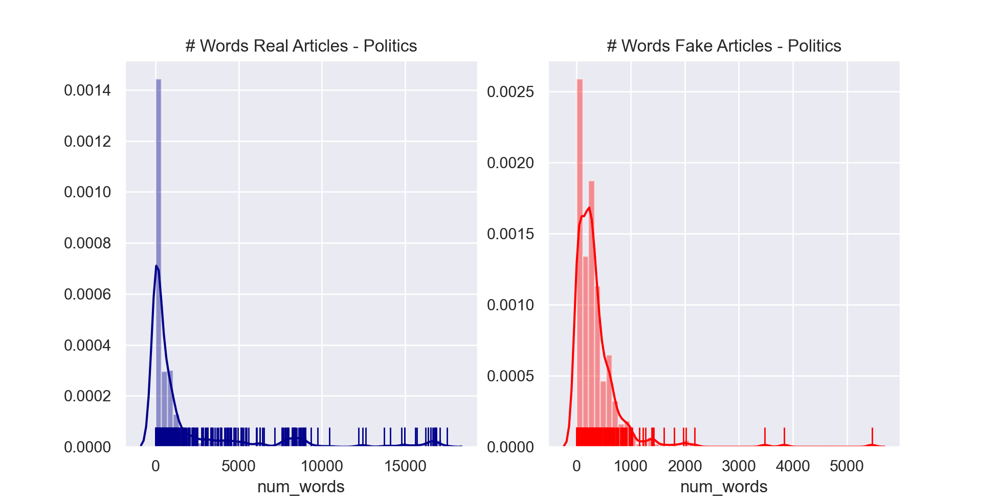

In [100]:
# look at article length - politics
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
sns.distplot(polit[polit['target']=='real']['num_words'], 
             ax = ax[0], color = "darkblue", rug = True).set_title("# Words Real Articles - Politics")
sns.distplot(polit[polit['target']=='fake']['num_words'],
             ax = ax[1], color = "red", rug = True).set_title("# Words Fake Articles - Politics");

<IPython.core.display.Javascript object>


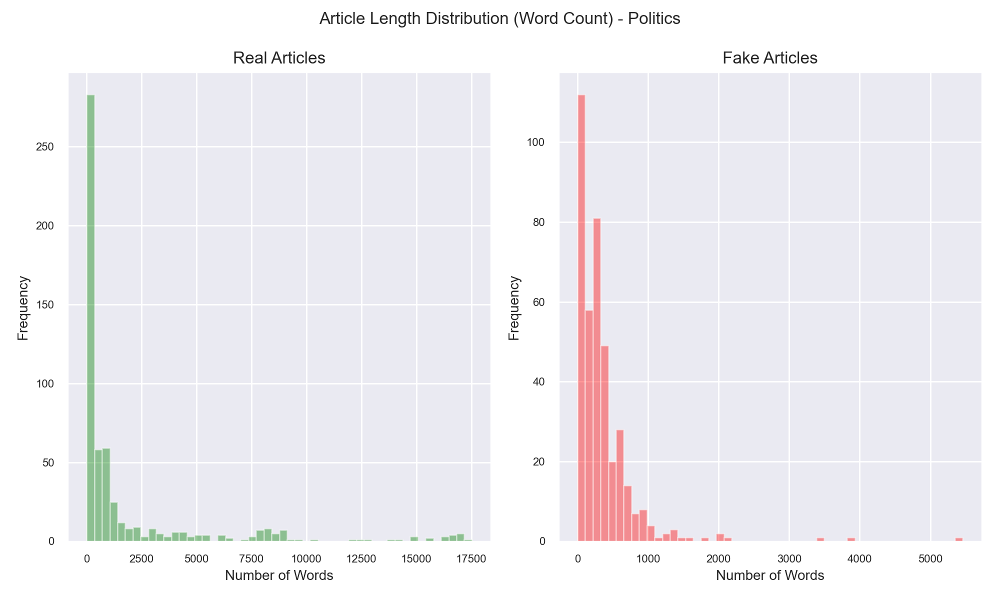

In [222]:
# plot word count distribution real/fake
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
sns.distplot(polit[polit['target']=='real']['num_words'], 
             ax = ax[0], color = "green", kde=False).set_title("Real Articles")
sns.distplot(polit[polit['target']=='fake']['num_words'],
             ax = ax[1], color = "red", kde=False).set_title("Fake Articles")

fig.suptitle("Article Length Distribution (Word Count) - Politics", fontsize=12)
ax[0].set_xlabel('Number of Words', fontsize=10)
ax[0].set_ylabel('Frequency', fontsize=10)
ax[0].tick_params(axis='x', labelsize=8) 
ax[0].tick_params(axis='y', labelsize=8)
ax[1].set_xlabel('Number of Words', fontsize=10)
ax[1].set_ylabel('Frequency', fontsize=10)
ax[1].tick_params(axis='x', labelsize=8) 
ax[1].tick_params(axis='y', labelsize=8)

fig.tight_layout()
fig.subplots_adjust(top=0.88);

<IPython.core.display.Javascript object>


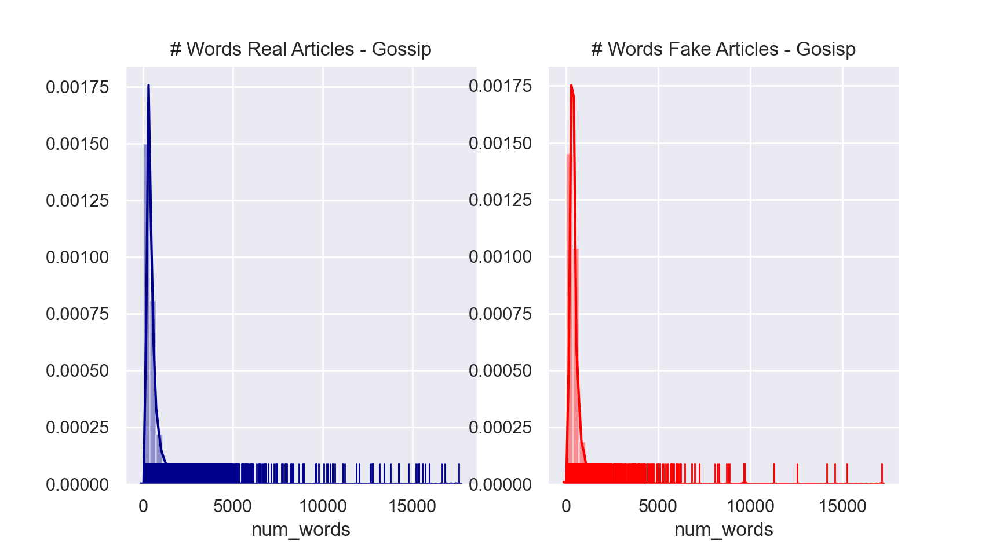

In [101]:
# look at article length - gossip
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
sns.distplot(gossip[gossip['target']=='real']['num_words'], 
             ax = ax[0], color = "darkblue", rug = True).set_title("# Words Real Articles - Gossip")
sns.distplot(gossip[gossip['target']=='fake']['num_words'],
             ax = ax[1], color = "red", rug = True).set_title("# Words Fake Articles - Gosisp");

<IPython.core.display.Javascript object>


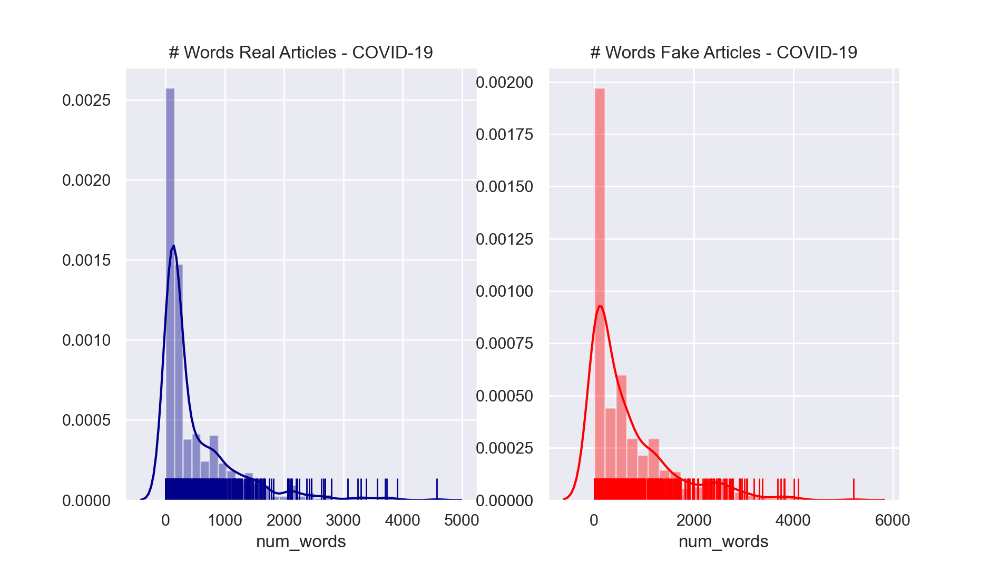

In [102]:
# look at article length - covid
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
sns.distplot(covid[covid['target']=='real']['num_words'], 
             ax = ax[0], color = "darkblue", rug = True).set_title("# Words Real Articles - COVID-19")
sns.distplot(covid[covid['target']=='fake']['num_words'],
             ax = ax[1], color = "red", rug = True).set_title("# Words Fake Articles - COVID-19");

<IPython.core.display.Javascript object>


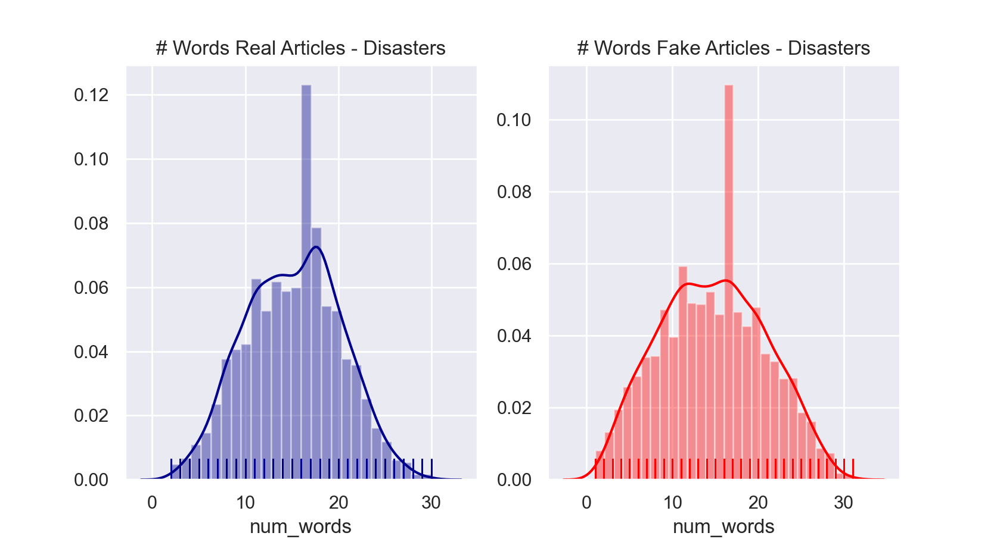

In [145]:
# look at article length - disasters
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
sns.distplot(natural[natural['target']=='real']['num_words'], 
             ax = ax[0], color = "darkblue", rug = True).set_title("# Words Real Articles - Disasters")
sns.distplot(natural[natural['target']=='fake']['num_words'],
             ax = ax[1], color = "red", rug = True).set_title("# Words Fake Articles - Disasters");

#### Character Counts - Exclamation Points

In [163]:
polit2 = df_balance[df_balance['id'].str.contains('polit')]
polit2.groupby(['target'])[['num_excl']].sum()

,num_excl
target,
fake,266
real,109


In [164]:
gossip2 = df_balance[df_balance['id'].str.contains('gossip')]
gossip2.groupby(['target'])[['num_excl']].sum()

,num_excl
target,
fake,8262
real,12110


In [217]:
gossip2.groupby(['target'])[['num_excl_title']].sum()

,num_excl_title
target,
fake,354
real,424


In [165]:
covid2 = df_balance[df_balance['id'].str.contains('covid')]
covid2.groupby(['target'])[['num_excl']].sum()

,num_excl
target,
fake,365
real,17


In [166]:
natural2 = df_balance[df_balance['id'].str.contains('natural')]
natural2.groupby(['target'])[['num_excl']].sum()

,num_excl
target,
fake,843
real,201


#### Character Counts - Quotation Marks

In [172]:
polit2 = df_balance[df_balance['id'].str.contains('polit')]
polit2.groupby(['target'])[['num_quote']].sum()

,num_quote
target,
fake,527
real,1933


In [173]:
gossip2 = df_balance[df_balance['id'].str.contains('gossip')]
gossip2.groupby(['target'])[['num_quote']].sum()

,num_quote
target,
fake,31429
real,56911


In [174]:
covid2 = df_balance[df_balance['id'].str.contains('covid')]
covid2.groupby(['target'])[['num_quote']].sum()

,num_quote
target,
fake,1030
real,538


In [175]:
natural2 = df_balance[df_balance['id'].str.contains('natural')]
natural2.groupby(['target'])[['num_quote']].sum()

,num_quote
target,
fake,0
real,0


#### Title Length

In [176]:
polit2.groupby(['target'])[['num_words_title']].sum()

,num_words_title
target,
fake,4596
real,2300


In [177]:
polit2.groupby(['target'])[['num_words_title']].mean()

,num_words_title
target,
fake,11.606061
real,7.958478


In [178]:
gossip2.groupby(['target'])[['num_words_title']].sum()

,num_words_title
target,
fake,54848
real,87370


In [179]:
gossip2.groupby(['target'])[['num_words_title']].mean()

,num_words_title
target,
fake,11.193469
real,11.152668


In [180]:
covid2.groupby(['target'])[['num_words_title']].sum()

,num_words_title
target,
fake,5998
real,3578


In [181]:
covid2.groupby(['target'])[['num_words_title']].mean()

,num_words_title
target,
fake,10.431304
real,10.777108


In [182]:
natural2.groupby(['target'])[['num_words_title']].sum()

,num_words_title
target,
fake,0
real,0


In [183]:
natural2.groupby(['target'])[['num_words_title']].mean()

,num_words_title
target,
fake,0
real,0


#### News Sources

<IPython.core.display.Javascript object>


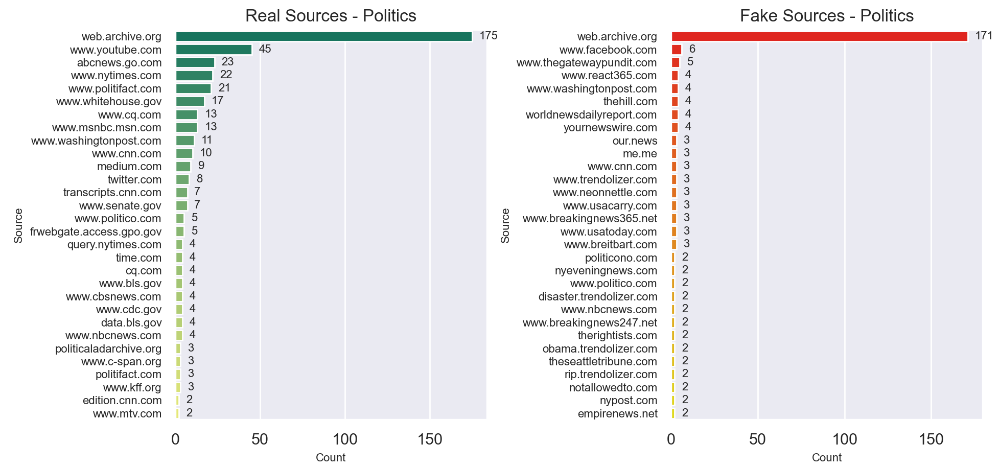

In [104]:
# look at sources - politics
real_source_polit = polit[(polit['target']=='real') & (polit['source2']!='')]['source2'].value_counts().sort_values(ascending=False).iloc[:30].index
fake_source_polit = polit[(polit['target']=='fake') & (polit['source2']!='')]['source2'].value_counts().sort_values(ascending=False).iloc[:30].index

fig, ax = plt.subplots(1, 2, figsize=(10, 6))
sns.countplot(data=polit[(polit['target']=='real') & (polit['source2']!='')], y='source2', 
              order=real_source_polit, palette='summer',  ax = ax[0]).set_title("Real Sources - Politics")
sns.countplot(data=polit[(polit['target']=='fake') & (polit['source2']!='')], y='source2', 
              order=fake_source_polit,palette='autumn',  ax = ax[1]).set_title("Fake Sources - Politics")
ax[0].yaxis.set_tick_params(labelsize=8)
ax[0].set_xlabel('Count', fontsize=8)
ax[0].set_ylabel('Source',fontsize=8)
ax[1].yaxis.set_tick_params(labelsize=8)
ax[1].set_xlabel('Count', fontsize=8)
ax[1].set_ylabel('Source',fontsize=8)
fig.tight_layout()

for p in ax[0].patches:
    ax[0].annotate("%.f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha="left", va="center", fontsize=8)
    
for p in ax[1].patches:
    ax[1].annotate("%.f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha="left", va="center", fontsize=8);

<IPython.core.display.Javascript object>


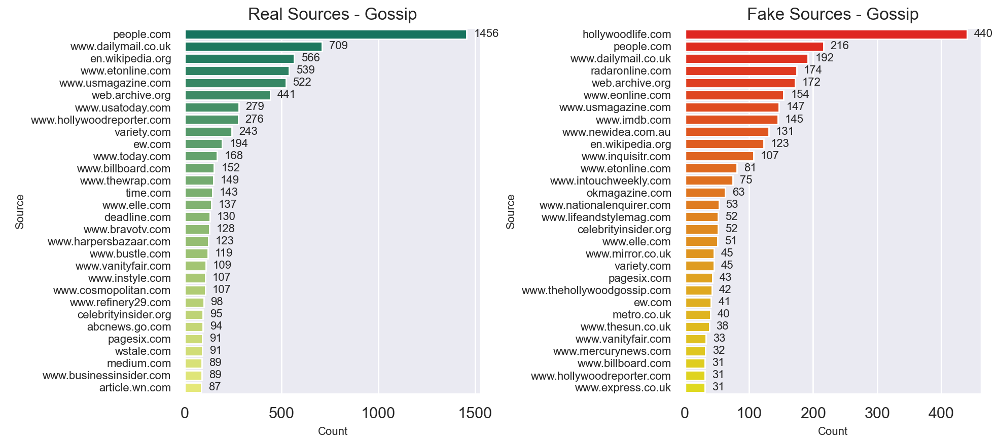

In [106]:
# look at sources - gossip
real_source_gossip = gossip[(gossip['target']=='real') & (gossip['source2']!='')]['source2'].value_counts().sort_values(ascending=False).iloc[:30].index
fake_source_gossip = gossip[(gossip['target']=='fake') & (gossip['source2']!='')]['source2'].value_counts().sort_values(ascending=False).iloc[:30].index

fig, ax = plt.subplots(1, 2, figsize=(10, 6))
sns.countplot(data=gossip[(gossip['target']=='real') & (gossip['source2']!='')], y='source2', 
              order=real_source_gossip, palette='summer',  ax = ax[0]).set_title("Real Sources - Gossip")
sns.countplot(data=gossip[(gossip['target']=='fake') & (gossip['source2']!='')], y='source2', 
              order=fake_source_gossip,palette='autumn',  ax = ax[1]).set_title("Fake Sources - Gossip")
ax[0].yaxis.set_tick_params(labelsize=8)
ax[0].set_xlabel('Count', fontsize=8)
ax[0].set_ylabel('Source',fontsize=8)
ax[1].yaxis.set_tick_params(labelsize=8)
ax[1].set_xlabel('Count', fontsize=8)
ax[1].set_ylabel('Source',fontsize=8)
fig.tight_layout()

for p in ax[0].patches:
    ax[0].annotate("%.f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha="left", va="center", fontsize=8)
    
for p in ax[1].patches:
    ax[1].annotate("%.f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha="left", va="center", fontsize=8);

In [114]:
# covid has really long source - try to clean it up
covid['source2'] = np.where(covid['source2'].str.contains('www.who.int/emergencies/diseases'), 'www.who.init', covid['source2'])

/Users/suryamenon/miniconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [115]:
covid[covid['source2'].str.contains('www.who.int/emergencies/diseases')]

,id,title,text,source,target,num_words,num_chars,source2,clean_text,clean_title,num_words_title,clean_text2,neg,neu,pos,compound,polarity


<IPython.core.display.Javascript object>


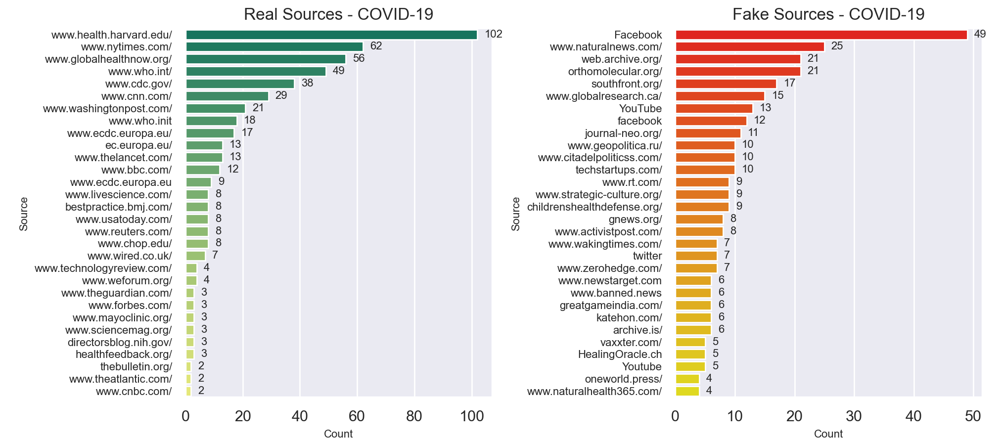

In [116]:
# look at sources - covid
real_source_covid = covid[(covid['target']=='real') & (covid['source2']!='')]['source2'].value_counts().sort_values(ascending=False).iloc[:30].index
fake_source_covid = covid[(covid['target']=='fake') & (covid['source2']!='')]['source2'].value_counts().sort_values(ascending=False).iloc[:30].index

fig, ax = plt.subplots(1, 2, figsize=(10, 6))
sns.countplot(data=covid[(covid['target']=='real') & (covid['source2']!='')], y='source2', 
              order=real_source_covid, palette='summer',  ax = ax[0]).set_title("Real Sources - COVID-19")
sns.countplot(data=covid[(covid['target']=='fake') & (covid['source2']!='')], y='source2', 
              order=fake_source_covid,palette='autumn',  ax = ax[1]).set_title("Fake Sources - COVID-19")
ax[0].yaxis.set_tick_params(labelsize=8)
ax[0].set_xlabel('Count', fontsize=8)
ax[0].set_ylabel('Source',fontsize=8)
ax[1].yaxis.set_tick_params(labelsize=8)
ax[1].set_xlabel('Count', fontsize=8)
ax[1].set_ylabel('Source',fontsize=8)
fig.tight_layout()

for p in ax[0].patches:
    ax[0].annotate("%.f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha="left", va="center", fontsize=8)
    
for p in ax[1].patches:
    ax[1].annotate("%.f" % p.get_width(), xy=(p.get_width(), p.get_y()+p.get_height()/2),
            xytext=(5, 0), textcoords='offset points', ha="left", va="center", fontsize=8);

The data for disasters tweets had no sources so we don't look at it here


#### Word Clouds

<IPython.core.display.Javascript object>


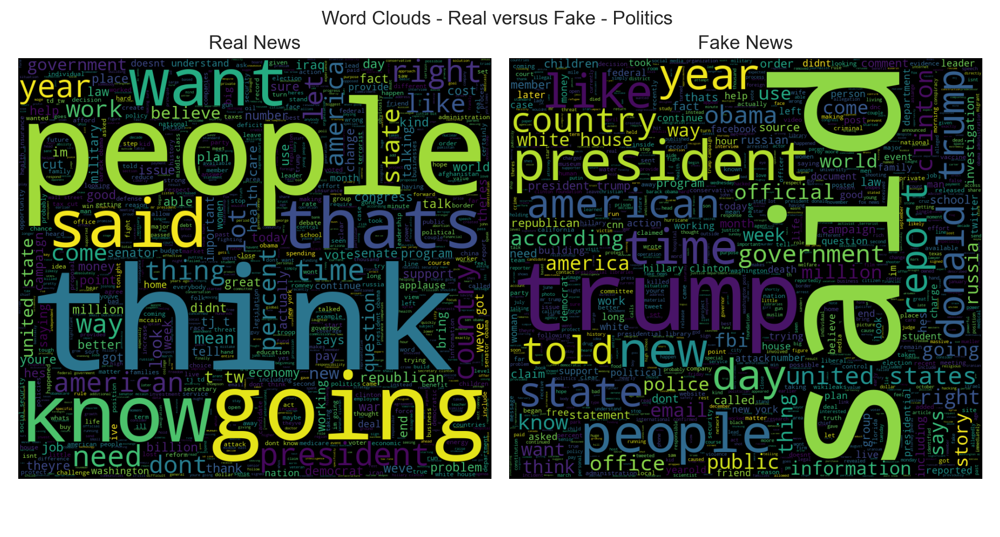

In [118]:
# word clouds gensim - politics
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
wc_real_polit = WordCloud(max_words = 2000 , width = 900 , height = 800 , 
                    stopwords = gensim_stop).generate(" ".join(polit[(polit['target']=='real')]['clean_text']))
ax[0].imshow(wc_real_polit , interpolation = 'bilinear')
ax[0].set_title('Real News')
ax[0].axis('off')
wc_fake_polit = WordCloud(max_words = 2000 , width = 900 , height = 800 , 
                    stopwords = gensim_stop).generate(" ".join(polit[(polit['target']=='fake')]['clean_text']))
ax[1].imshow(wc_fake_polit , interpolation = 'bilinear')
ax[1].set_title('Fake News')
ax[1].axis('off')
fig.suptitle('Word Clouds - Real versus Fake - Politics ', fontsize=12)
fig.tight_layout();

<IPython.core.display.Javascript object>


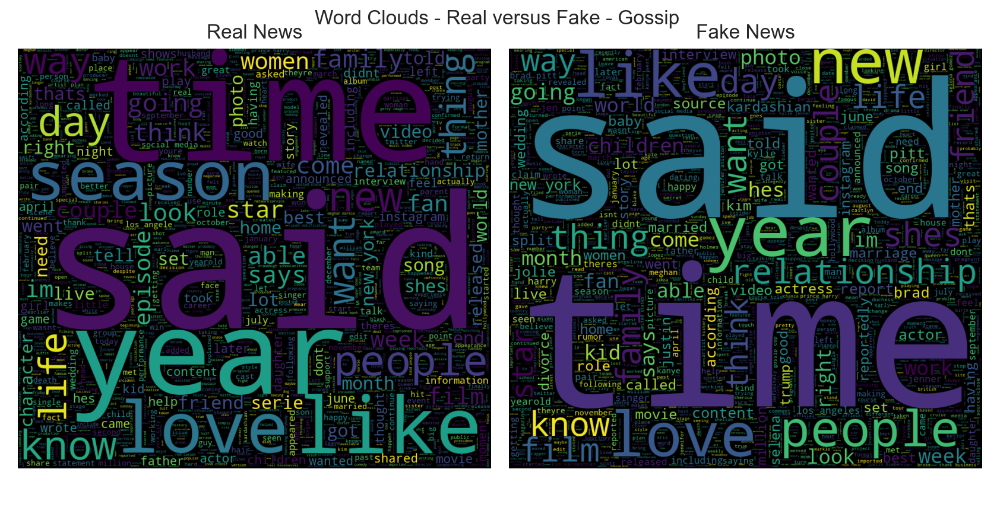

In [119]:
# word clouds gensim - gossip
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
wc_real_gossip = WordCloud(max_words = 2000 , width = 900 , height = 800 , 
                    stopwords = gensim_stop).generate(" ".join(gossip[(gossip['target']=='real')]['clean_text']))
ax[0].imshow(wc_real_gossip , interpolation = 'bilinear')
ax[0].set_title('Real News')
ax[0].axis('off')
wc_fake_gossip = WordCloud(max_words = 2000 , width = 900 , height = 800 , 
                    stopwords = gensim_stop).generate(" ".join(gossip[(gossip['target']=='fake')]['clean_text']))
ax[1].imshow(wc_fake_gossip , interpolation = 'bilinear')
ax[1].set_title('Fake News')
ax[1].axis('off')
fig.suptitle('Word Clouds - Real versus Fake - Gossip ', fontsize=12)
fig.tight_layout();

<IPython.core.display.Javascript object>


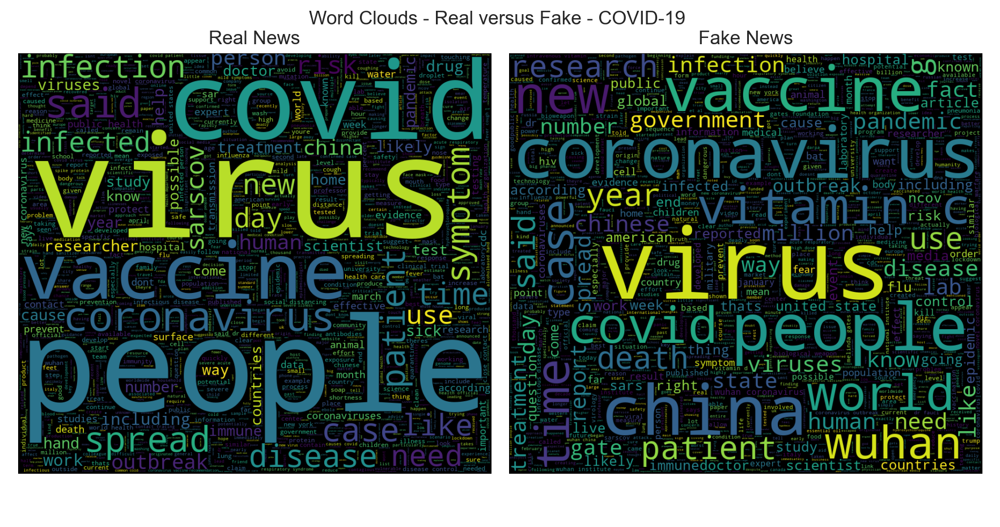

In [120]:
# word clouds gensim - covid
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
wc_real_covid = WordCloud(max_words = 2000 , width = 900 , height = 800 , 
                    stopwords = gensim_stop).generate(" ".join(covid[(covid['target']=='real')]['clean_text']))
ax[0].imshow(wc_real_covid , interpolation = 'bilinear')
ax[0].set_title('Real News')
ax[0].axis('off')
wc_fake_covid = WordCloud(max_words = 2000 , width = 900 , height = 800 , 
                    stopwords = gensim_stop).generate(" ".join(covid[(covid['target']=='fake')]['clean_text']))
ax[1].imshow(wc_fake_covid , interpolation = 'bilinear')
ax[1].set_title('Fake News')
ax[1].axis('off')
fig.suptitle('Word Clouds - Real versus Fake - COVID-19 ', fontsize=12)
fig.tight_layout();

<IPython.core.display.Javascript object>


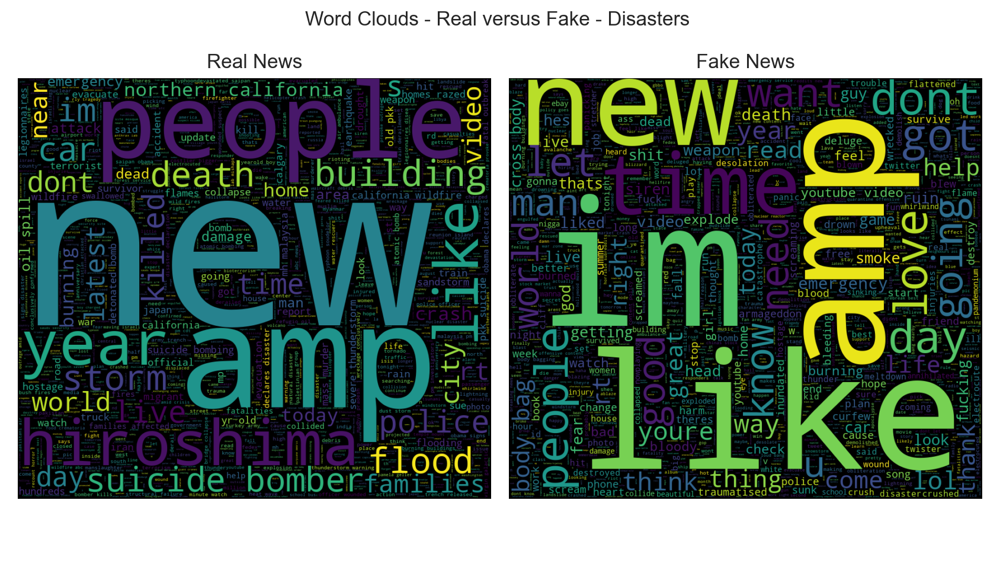

In [146]:
# word clouds gensim - disasters
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
wc_real_natural = WordCloud(max_words = 2000 , width = 900 , height = 800 , 
                    stopwords = gensim_stop).generate(" ".join(natural[(natural['target']=='real')]['clean_text']))
ax[0].imshow(wc_real_natural , interpolation = 'bilinear')
ax[0].set_title('Real News')
ax[0].axis('off')
wc_fake_natural = WordCloud(max_words = 2000 , width = 900 , height = 800 , 
                    stopwords = gensim_stop).generate(" ".join(natural[(natural['target']=='fake')]['clean_text']))
ax[1].imshow(wc_fake_natural , interpolation = 'bilinear')
ax[1].set_title('Fake News')
ax[1].axis('off')
fig.suptitle('Word Clouds - Real versus Fake - Disasters ', fontsize=12)
fig.tight_layout();

#### Bigrams
Trigrams did not seem too informative in this data, so we focused on bigrams by topic

In [123]:
# token, bigram - politics
true_token_polit = token_text(polit[polit['target']=='real'])
false_token_polit = token_text(polit[polit['target']=='fake'])

bi_true_polit = pd.Series(ngrams(true_token_polit, 2)).value_counts()[:20]
bi_false_polit = pd.Series(ngrams(false_token_polit, 2)).value_counts()[:20]

<IPython.core.display.Javascript object>


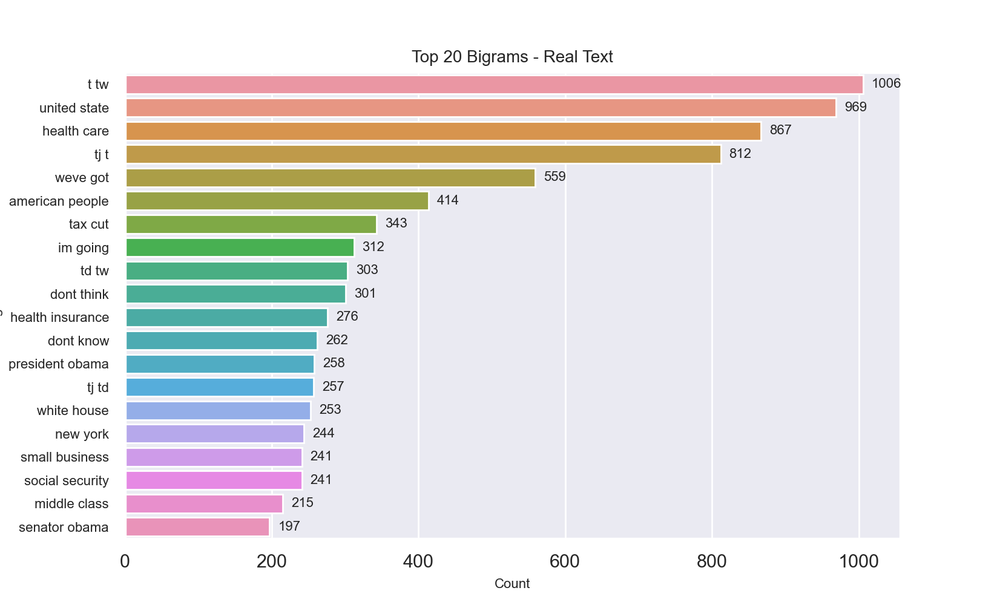

In [127]:
# plot real - politics
plot_ngram(bi_true_polit, 'Bigram', 'Real')

<IPython.core.display.Javascript object>


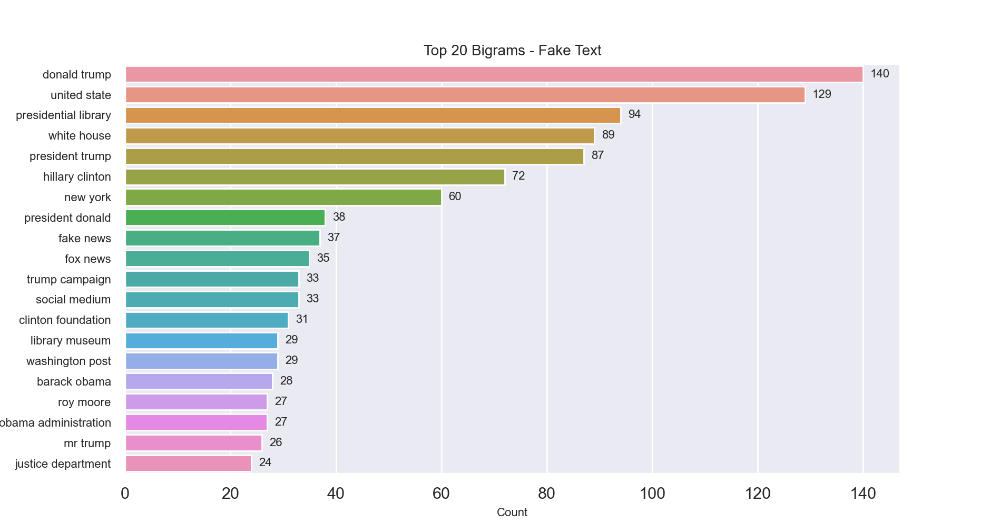

In [129]:
# plot fake - politics
plot_ngram(bi_false_polit, 'Bigram', 'Fake')

In [124]:
# token, bigram - gossip
true_token_gossip = token_text(gossip[gossip['target']=='real'])
false_token_gossip = token_text(gossip[gossip['target']=='fake'])

bi_true_gossip = pd.Series(ngrams(true_token_gossip, 2)).value_counts()[:20]
bi_false_gossip = pd.Series(ngrams(false_token_gossip, 2)).value_counts()[:20]

<IPython.core.display.Javascript object>


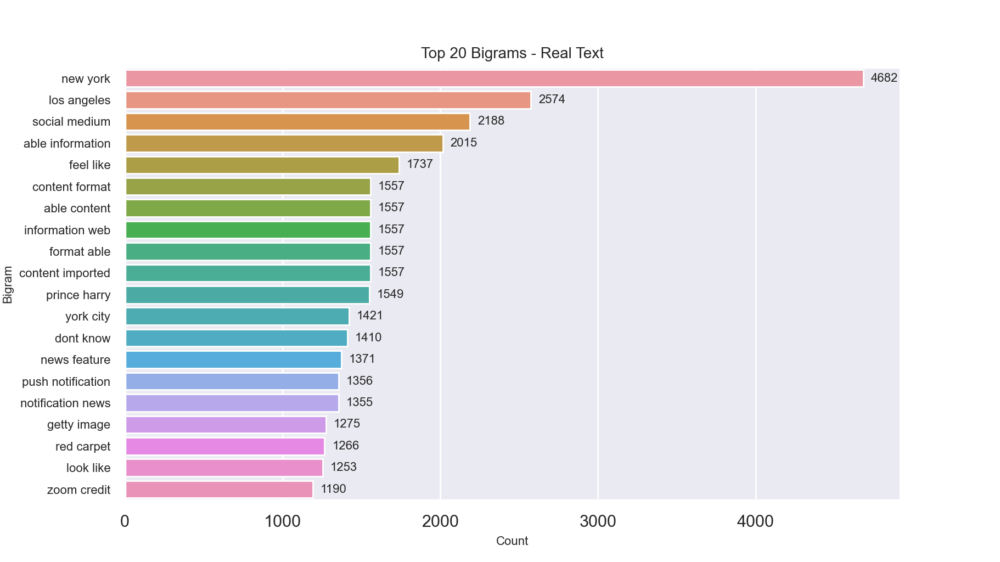

In [131]:
# plot real - gossip
plot_ngram(bi_true_gossip, 'Bigram', 'Real')

<IPython.core.display.Javascript object>


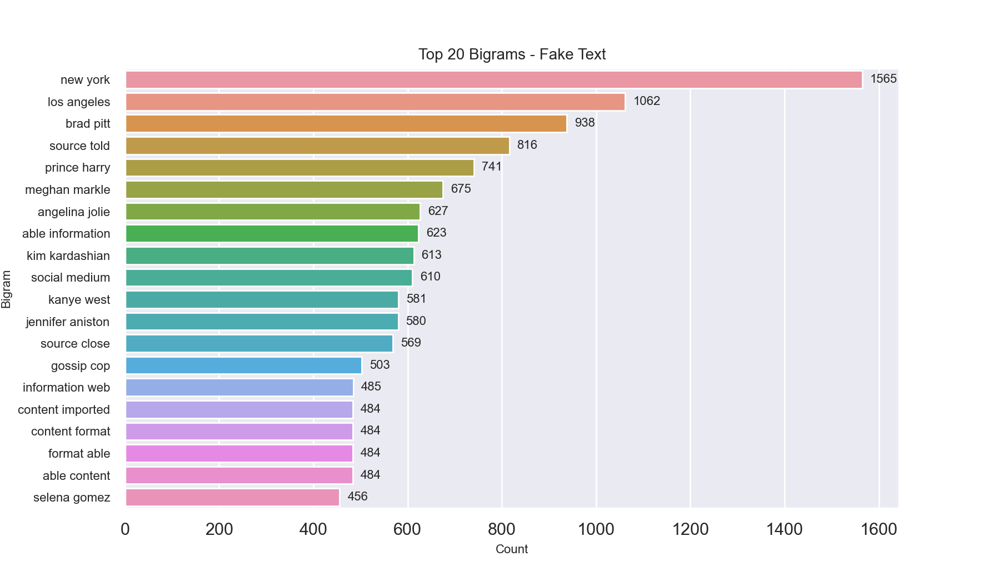

In [132]:
# plot fake - gossip
plot_ngram(bi_false_gossip, 'Bigram', 'Fake')

In [125]:
# token, bigram - covid
true_token_covid = token_text(covid[covid['target']=='real'])
false_token_covid = token_text(covid[covid['target']=='fake'])

bi_true_covid = pd.Series(ngrams(true_token_covid, 2)).value_counts()[:20]
bi_false_covid = pd.Series(ngrams(false_token_covid, 2)).value_counts()[:20]

<IPython.core.display.Javascript object>


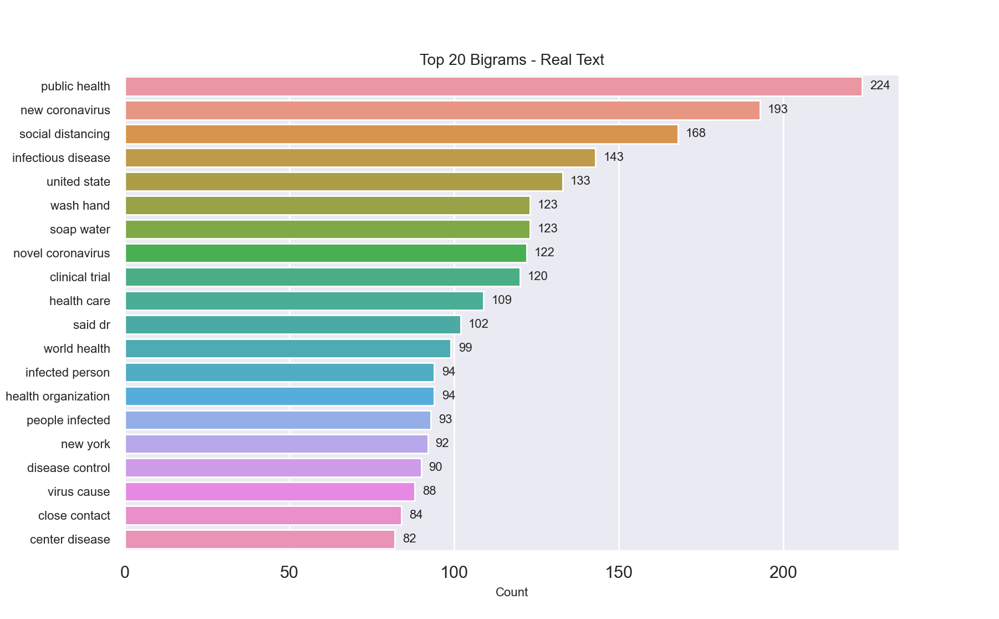

In [133]:
# plot real - covid
plot_ngram(bi_true_covid, 'Bigram', 'Real')

<IPython.core.display.Javascript object>


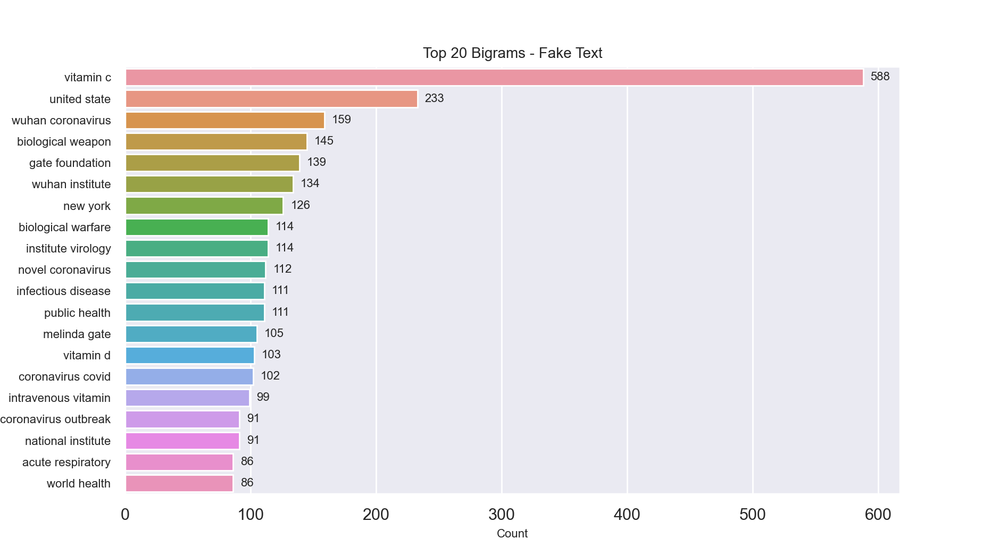

In [134]:
# plot fake - covid
plot_ngram(bi_false_covid, 'Bigram', 'Fake')

In [126]:
# token, bigram - disaster
true_token_natural = token_text(natural[natural['target']=='real'])
false_token_natural = token_text(natural[natural['target']=='fake'])

bi_true_natural = pd.Series(ngrams(true_token_natural, 2)).value_counts()[:20]
bi_false_natural = pd.Series(ngrams(false_token_natural, 2)).value_counts()[:20]

<IPython.core.display.Javascript object>


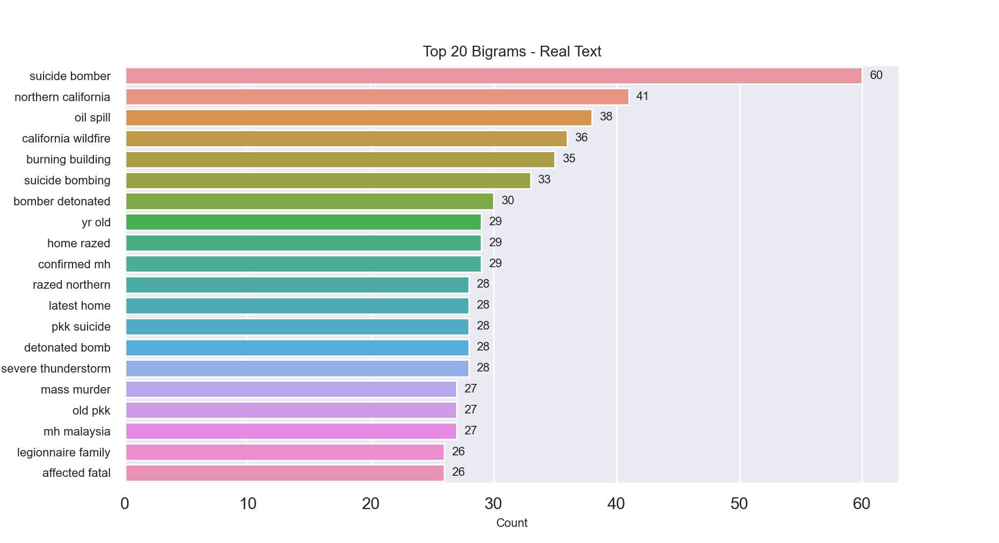

In [135]:
# plot real - disaster
plot_ngram(bi_true_natural, 'Bigram', 'Real')

<IPython.core.display.Javascript object>


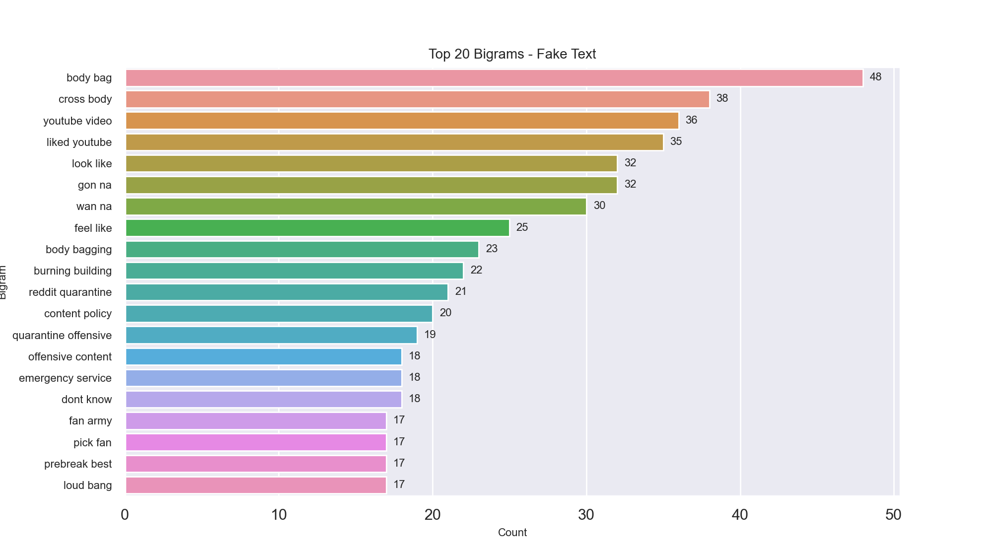

In [136]:
# plot fake - disaster
plot_ngram(bi_false_natural, 'Bigram', 'Fake')

#### Sentiment Analysis
Specifically, negativity and polarity scores by topic

<IPython.core.display.Javascript object>


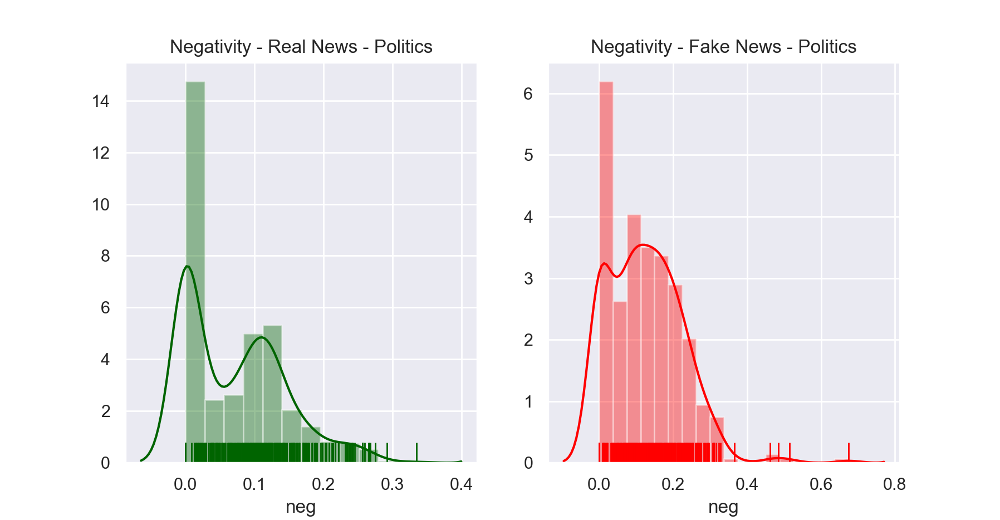

In [137]:
# politics - negative
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
sns.distplot(polit[polit['target']=='real']['neg'], 
             ax = ax[0], color = "darkgreen", rug = True).set_title("Negativity - Real News - Politics")
sns.distplot(polit[polit['target']=='fake']['neg'],
             ax = ax[1], color = "red", rug = True).set_title("Negativity - Fake News - Politics");

<IPython.core.display.Javascript object>


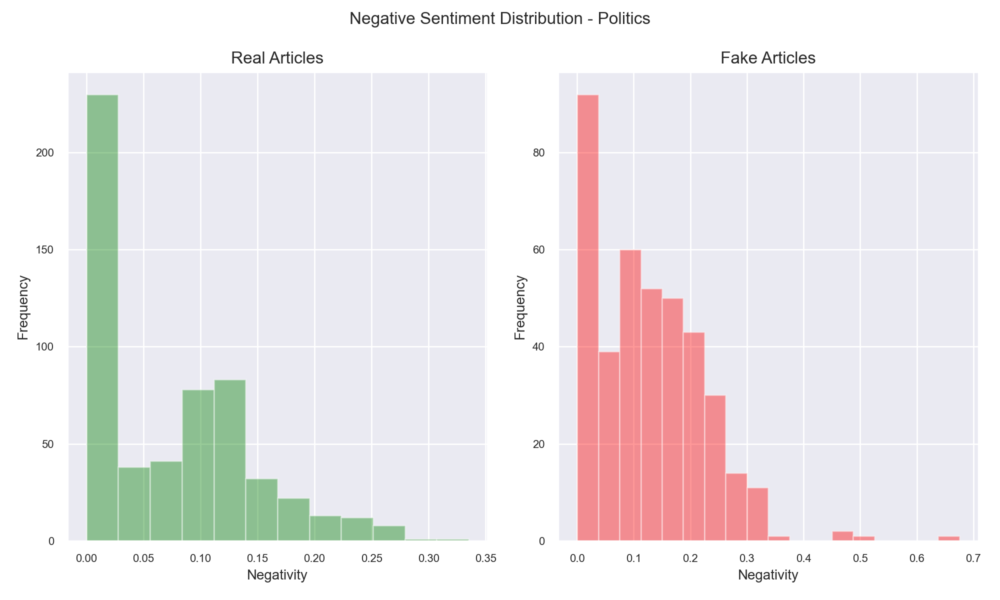

In [232]:
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
sns.distplot(polit[polit['target']=='real']['neg'], 
             ax = ax[0], color = "green", kde=False).set_title("Real Articles")
sns.distplot(polit[polit['target']=='fake']['neg'],
             ax = ax[1], color = "red", kde=False).set_title("Fake Articles")

fig.suptitle("Negative Sentiment Distribution - Politics", fontsize=12)
ax[0].set_xlabel('Negativity', fontsize=10)
ax[0].set_ylabel('Frequency', fontsize=10)
ax[0].tick_params(axis='x', labelsize=8) 
ax[0].tick_params(axis='y', labelsize=8)
ax[1].set_xlabel('Negativity', fontsize=10)
ax[1].set_ylabel('Frequency', fontsize=10)
ax[1].tick_params(axis='x', labelsize=8) 
ax[1].tick_params(axis='y', labelsize=8)

fig.tight_layout()
fig.subplots_adjust(top=0.88);

<IPython.core.display.Javascript object>


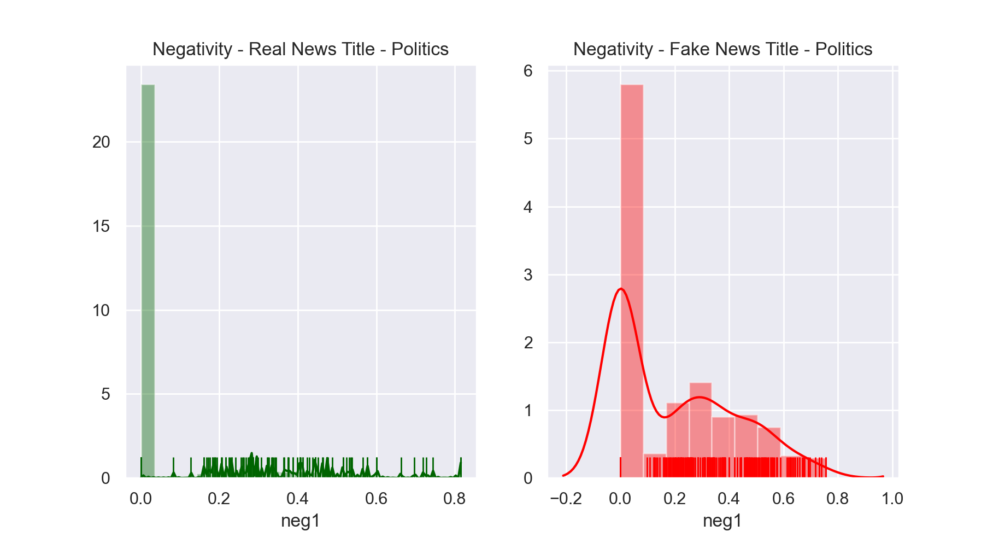

In [201]:
# politics - negative - title
polit3 = tweet_data[tweet_data['id'].str.contains('polit')]
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
sns.distplot(polit3[polit3['target']=='real']['neg1'], 
             ax = ax[0], color = "darkgreen", rug = True).set_title("Negativity - Real News Title - Politics")
sns.distplot(polit3[polit3['target']=='fake']['neg1'],
             ax = ax[1], color = "red", rug = True).set_title("Negativity - Fake News Title - Politics");

<IPython.core.display.Javascript object>


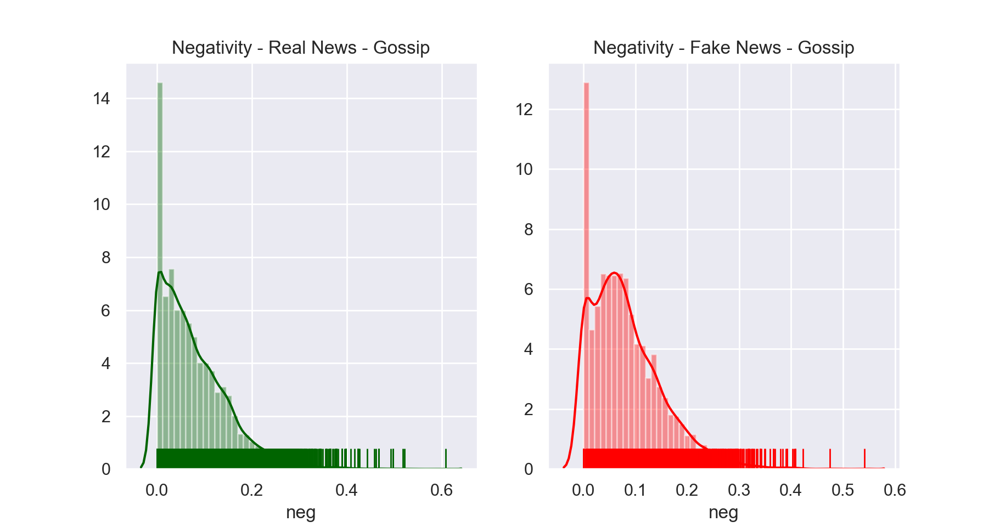

In [138]:
# gossip - negative
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
sns.distplot(gossip[gossip['target']=='real']['neg'], 
             ax = ax[0], color = "darkgreen", rug = True).set_title("Negativity - Real News - Gossip")
sns.distplot(gossip[gossip['target']=='fake']['neg'],
             ax = ax[1], color = "red", rug = True).set_title("Negativity - Fake News - Gossip");

<IPython.core.display.Javascript object>


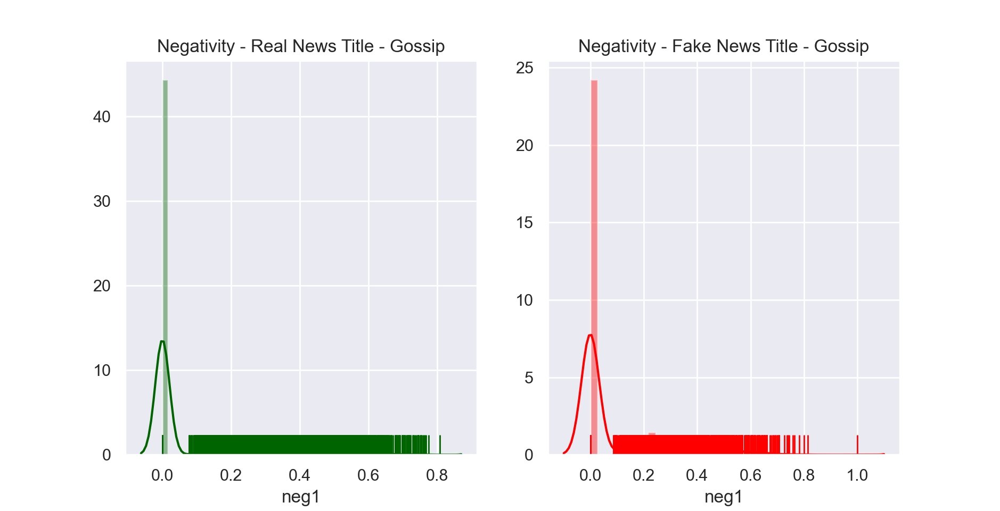

In [202]:
# gossip - negative - title
gossip3 = tweet_data[tweet_data['id'].str.contains('gossip')]
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
sns.distplot(gossip3[gossip3['target']=='real']['neg1'], 
             ax = ax[0], color = "darkgreen", rug = True).set_title("Negativity - Real News Title - Gossip")
sns.distplot(gossip3[gossip3['target']=='fake']['neg1'],
             ax = ax[1], color = "red", rug = True).set_title("Negativity - Fake News Title - Gossip");

<IPython.core.display.Javascript object>


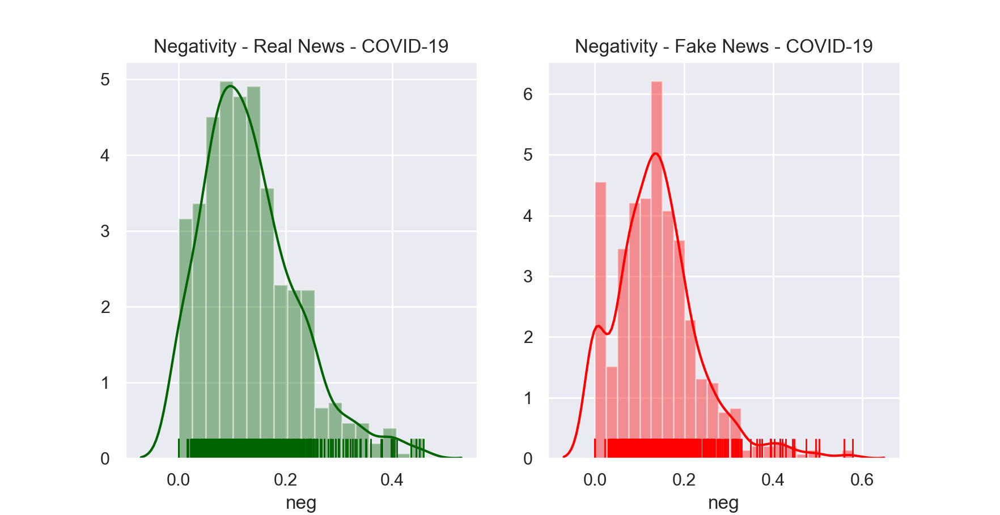

In [139]:
# covid - negative
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
sns.distplot(covid[covid['target']=='real']['neg'], 
             ax = ax[0], color = "darkgreen", rug = True).set_title("Negativity - Real News - COVID-19")
sns.distplot(covid[covid['target']=='fake']['neg'],
             ax = ax[1], color = "red", rug = True).set_title("Negativity - Fake News - COVID-19");

<IPython.core.display.Javascript object>


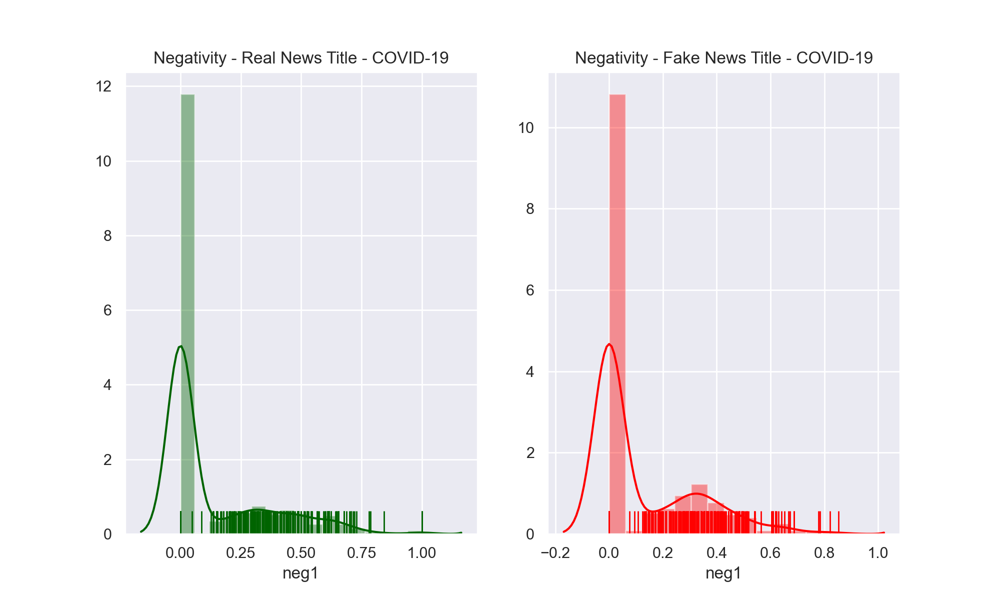

In [204]:
# covid - negative - title (none for natural disasters)
covid3 = tweet_data[tweet_data['id'].str.contains('covid')]
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
sns.distplot(covid3[covid3['target']=='real']['neg1'], 
             ax = ax[0], color = "darkgreen", rug = True).set_title("Negativity - Real News Title - COVID-19")
sns.distplot(covid3[covid3['target']=='fake']['neg1'],
             ax = ax[1], color = "red", rug = True).set_title("Negativity - Fake News Title - COVID-19");

<IPython.core.display.Javascript object>


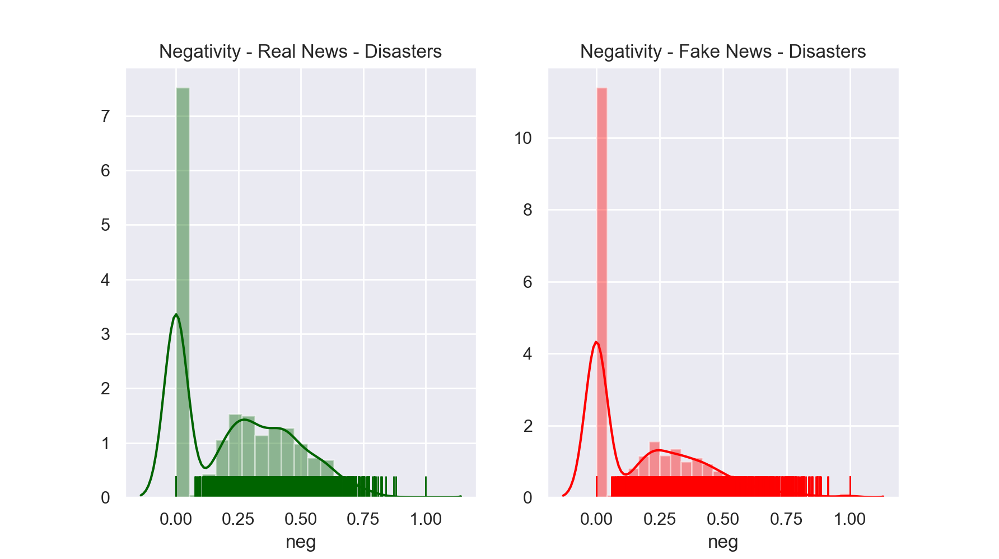

In [147]:
# disasters - negative
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
sns.distplot(natural[natural['target']=='real']['neg'], 
             ax = ax[0], color = "darkgreen", rug = True).set_title("Negativity - Real News - Disasters")
sns.distplot(natural[natural['target']=='fake']['neg'],
             ax = ax[1], color = "red", rug = True).set_title("Negativity - Fake News - Disasters");

<IPython.core.display.Javascript object>


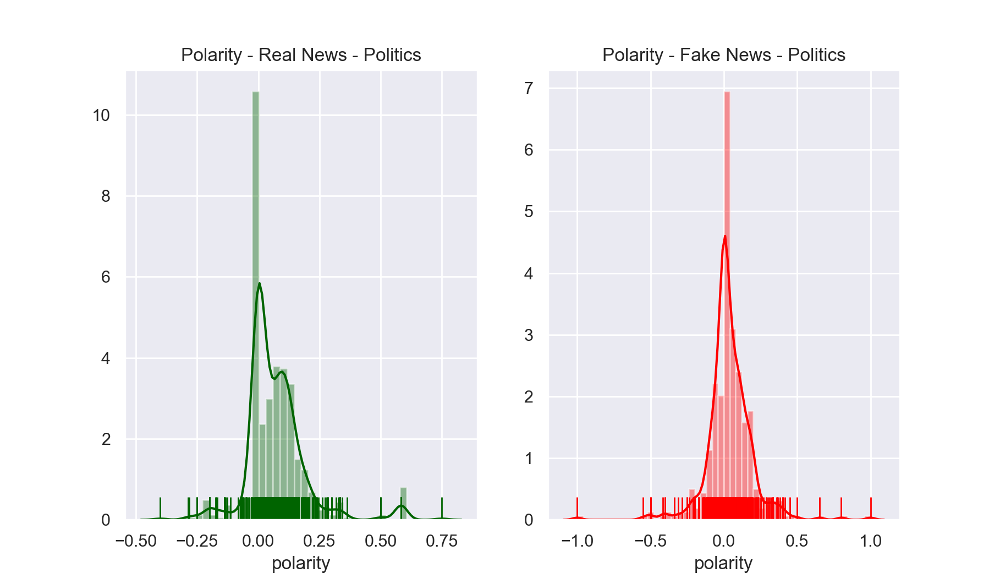

In [141]:
# politics - polarity
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
sns.distplot(polit[polit['target']=='real']['polarity'], 
             ax = ax[0], color = "darkgreen", rug = True).set_title("Polarity - Real News - Politics")
sns.distplot(polit[polit['target']=='fake']['polarity'],
             ax = ax[1], color = "red", rug = True).set_title("Polarity - Fake News - Politics");

<IPython.core.display.Javascript object>


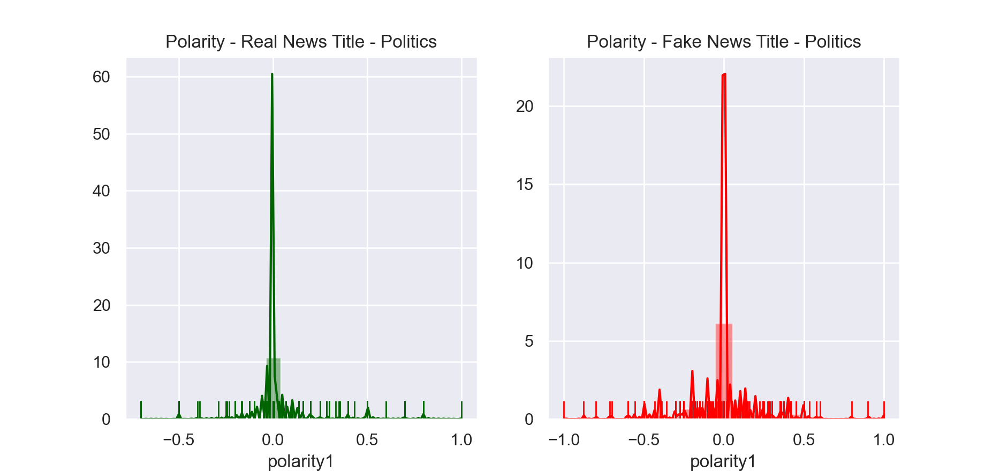

In [205]:
# polarity - title - politics
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
sns.distplot(polit3[polit3['target']=='real']['polarity1'], 
             ax = ax[0], color = "darkgreen", rug = True).set_title("Polarity - Real News Title - Politics")
sns.distplot(polit3[polit3['target']=='fake']['polarity1'],
             ax = ax[1], color = "red", rug = True).set_title("Polarity - Fake News Title - Politics");

<IPython.core.display.Javascript object>


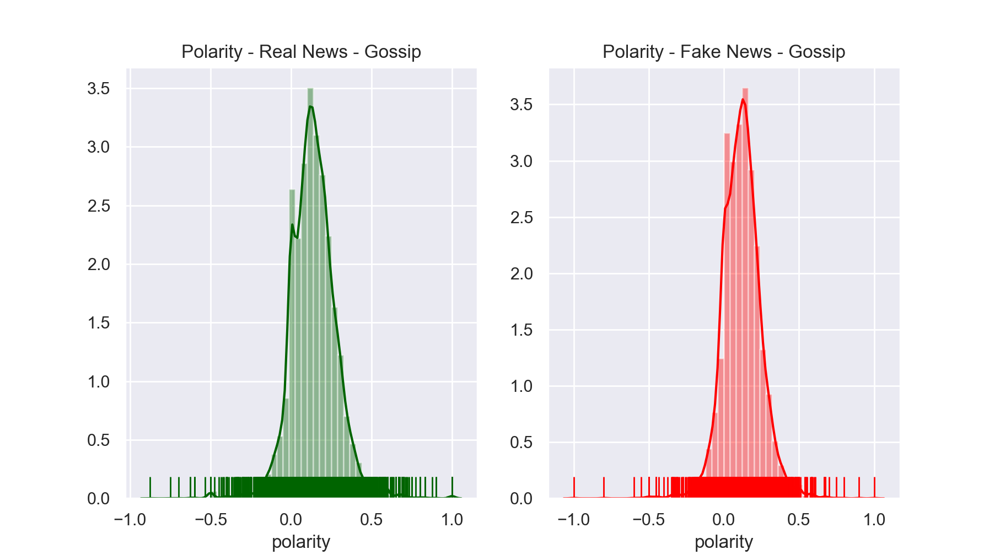

In [142]:
# gossip - polarity
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
sns.distplot(gossip[gossip['target']=='real']['polarity'], 
             ax = ax[0], color = "darkgreen", rug = True).set_title("Polarity - Real News - Gossip")
sns.distplot(gossip[gossip['target']=='fake']['polarity'],
             ax = ax[1], color = "red", rug = True).set_title("Polarity - Fake News - Gossip");

<IPython.core.display.Javascript object>


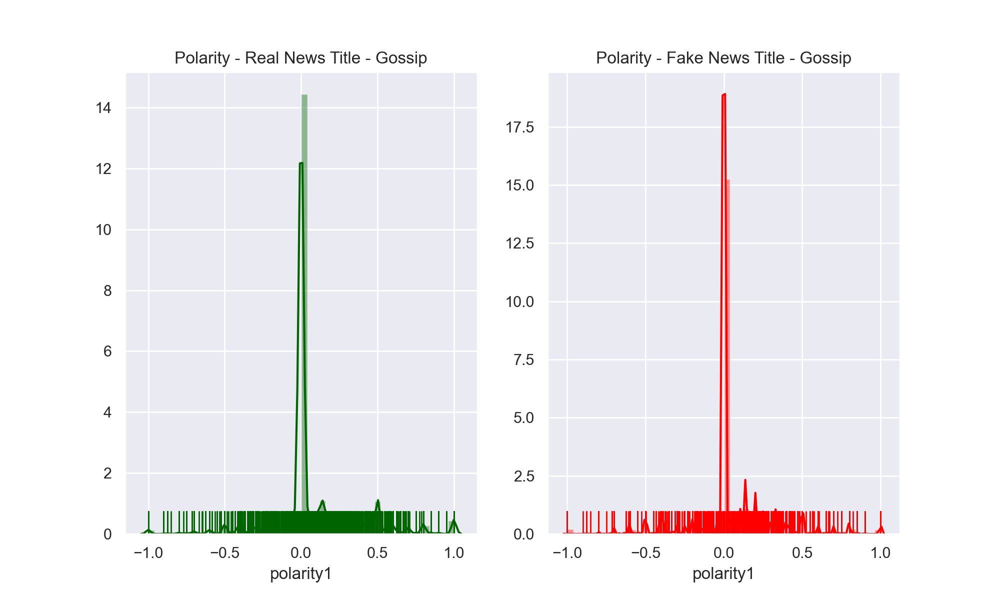

In [206]:
# gossip - title - polarity
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
sns.distplot(gossip3[gossip3['target']=='real']['polarity1'], 
             ax = ax[0], color = "darkgreen", rug = True).set_title("Polarity - Real News Title - Gossip")
sns.distplot(gossip3[gossip3['target']=='fake']['polarity1'],
             ax = ax[1], color = "red", rug = True).set_title("Polarity - Fake News Title - Gossip");

<IPython.core.display.Javascript object>


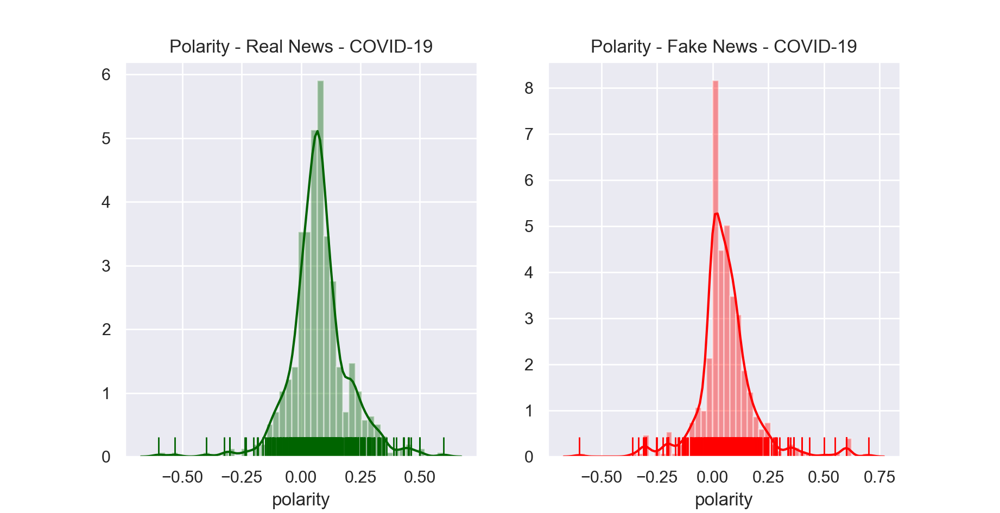

In [143]:
# covid - polarity
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
sns.distplot(covid[covid['target']=='real']['polarity'], 
             ax = ax[0], color = "darkgreen", rug = True).set_title("Polarity - Real News - COVID-19")
sns.distplot(covid[covid['target']=='fake']['polarity'],
             ax = ax[1], color = "red", rug = True).set_title("Polarity - Fake News - COVID-19");

<IPython.core.display.Javascript object>


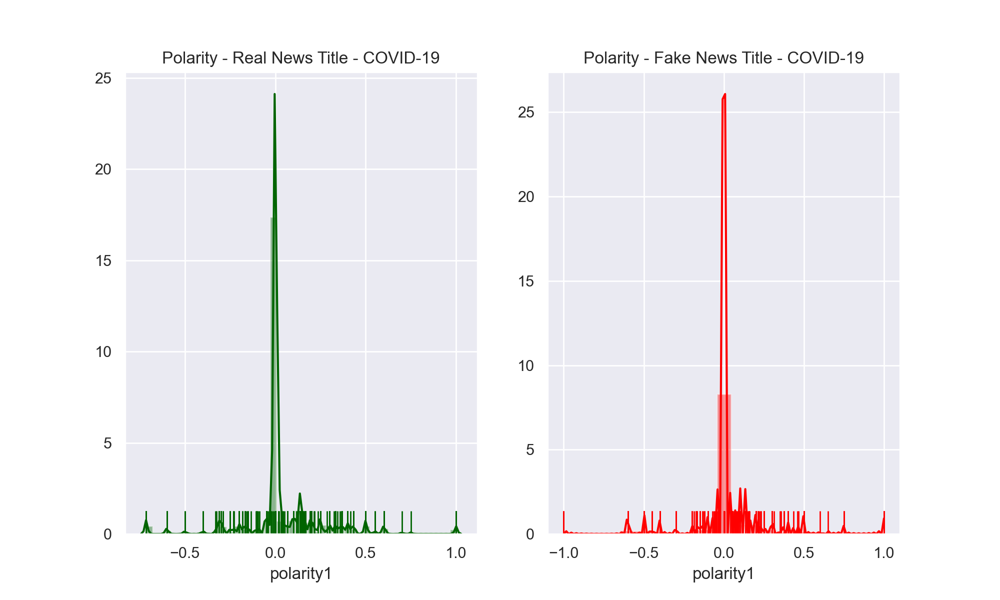

In [207]:
# covid - title - polarity
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
sns.distplot(covid3[covid3['target']=='real']['polarity1'], 
             ax = ax[0], color = "darkgreen", rug = True).set_title("Polarity - Real News Title - COVID-19")
sns.distplot(covid3[covid3['target']=='fake']['polarity1'],
             ax = ax[1], color = "red", rug = True).set_title("Polarity - Fake News Title - COVID-19");

<IPython.core.display.Javascript object>


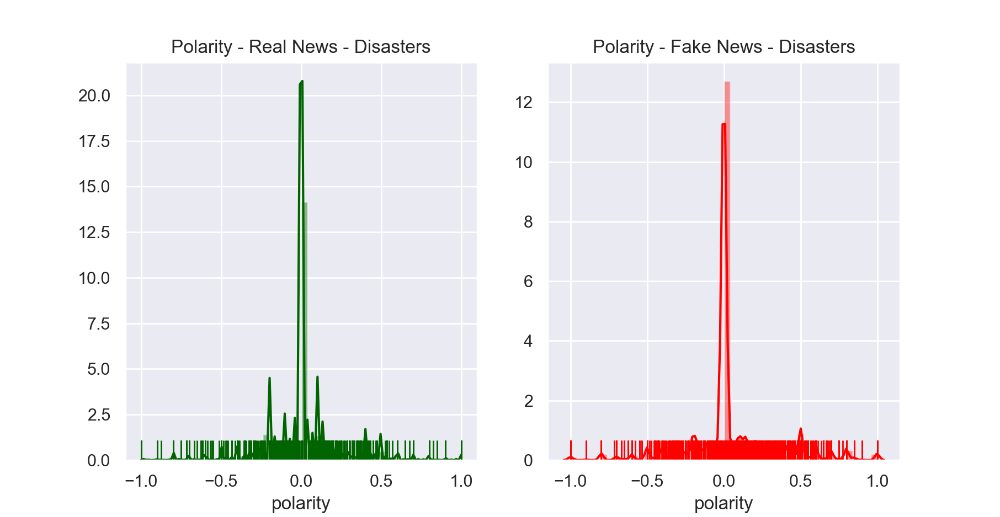

In [148]:
# disasters - negative
fig, ax = plt.subplots(1, 2, figsize=(10, 6))
sns.distplot(natural[natural['target']=='real']['polarity'], 
             ax = ax[0], color = "darkgreen", rug = True).set_title("Polarity - Real News - Disasters")
sns.distplot(natural[natural['target']=='fake']['polarity'],
             ax = ax[1], color = "red", rug = True).set_title("Polarity - Fake News - Disasters");